### **뉴스 & 댓글 토큰화를 위한 라이브러리 설치**

#### khaiii
https://github.com/kakao/khaiii

In [ ]:
!git clone https://github.com/kakao/khaiii.git
!pip install cmake
!mkdir build
!cd build && cmake /content/khaiii
!cd /content/build/ && make all
!cd /content/build/ && make resource
!cd /content/build && make install
!cd /content/build && make package_python
!pip install /content/build/package_python

Cloning into 'khaiii'...
remote: Enumerating objects: 1024, done.
remote: Counting objects: 100% (8/8), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 1024 (delta 3), reused 7 (delta 3), pack-reused 1016
Receiving objects: 100% (1024/1024), 33.03 MiB | 12.18 MiB/s, done.
Resolving deltas: 100% (436/436), done.
-- [hunter] Initializing Hunter workspace (70287b1ffa810ee4e952052a9adff9b4856d0d54)
-- [hunter]   https://github.com/ruslo/hunter/archive/v0.23.34.tar.gz
-- [hunter]   -> /root/.hunter/_Base/Download/Hunter/0.23.34/70287b1
-- The C compiler identification is GNU 7.5.0
-- The CXX compiler identification is GNU 7.5.0
-- Detecting C compiler ABI info
-- Detecting C compiler ABI info - done
-- Check for working C compiler: /usr/bin/cc - skipped
-- Detecting C compile features
-- Detecting C compile features - done
-- Detecting CXX compiler ABI info
-- Detecting CXX compiler ABI info - done
-- Check for working CXX compiler: /usr/bin/c++ - skipped
-- Detecting CXX

### **클래스 정의 & 선언**

In [ ]:
import numpy as np
import pandas as pd
from khaiii import KhaiiiApi

In [ ]:
class TokenizeNews:
  CorNewsDetail = pd.read_csv('./Corrected/news.csv', header = None, encoding="utf-8")
  CorNewsDetail.columns = ['date','title','summary']
  CorComment = pd.DataFrame(columns = ['comment'])

  TokenNewsDetail = pd.DataFrame(columns = ['date', 'title', 'summary'])
  TokenComment = pd.DataFrame(columns = ['comment'])

  NameList = ['20211201.csv', '20211202.csv']

  len_news = 0
  len_comment = 0

  api = KhaiiiApi()

  def initNews(self):
    self.CorNewsDetail = self.CorNewsDetail.fillna("Null")
    self.len_news = len(self.CorNewsDetail)

  def initComment(self, path):
    tmp = pd.read_csv(path, header = None, encoding="utf-8")
    tmp.columns = ['comment']
    self.CorComment = tmp
    self.CorComment = self.CorComment.fillna("Null")
    self.len_comment = len(self.CorComment)

  def tokenize(self, flag):
    if flag == 'news':
      for i in range(self.len_news):
        # ['date']
        tmp_date = self.CorNewsDetail['date'].iloc[i]
        # ['title']
        tmp_title = []
        for word in self.api.analyze(self.CorNewsDetail['title'].iloc[i]):
          for morph in word.morphs:
            tmp_title.append([morph.lex, morph.tag])
        # ['summary']
        tmp_summary = []
        for word in self.api.analyze(self.CorNewsDetail['summary'].iloc[i]):
          for morph in word.morphs:
            tmp_summary.append([morph.lex, morph.tag])
        # Token에 저장
        self.TokenNewsDetail.loc[i] = [tmp_date, tmp_title, tmp_summary]
    elif flag == 'comment':
      for i in range(self.len_comment):
        # ['comment']
        tmp_comment = []
        for word in self.api.analyze(self.CorComment['comment'].iloc[i]):
          for morph in word.morphs:
            tmp_comment.append([morph.lex, morph.tag])
        # Token에 저장
        self.TokenComment.loc[i] = [tmp_comment]
    else:
      print("flag 입력 없음")
  
  def showTitle(self):
    for i in range(self.len_news):
      print(self.TokenNewsDetail['title'].iloc[i])

  def showSummary(self):
    for i in range(self.len_news):
      print(self.TokenNewsDetail['summary'].iloc[i])

  def showComment(self):
    for i in range(self.len_comment):
      print(self.TokenComment['comment'].iloc[i])

  def storeNews(self):
    self.TokenNewsDetail.to_csv('./Token/news.csv', header = None, index = False, encoding="utf-8-sig")
  
  def storeComment(self, path):
    self.TokenComment.to_csv(path, header = None, index = False, encoding="utf-8-sig")

In [ ]:
token = TokenizeNews()

### **뉴스 텍스트 토큰화**

In [ ]:
token.initNews()
token.tokenize('news')
token.TokenNewsDetail.head()

,date,title,summary
0,20211001,"[[식약처, NNG], [“, SS], [던킨도, NNP], [너츠, NP], [나...","[[Null, SL]]"
1,20211001,"[[대출, NNG], [옥죄기, NNG], [에, JKB], [서민, NNG], [...","[[Null, SL]]"
2,20211001,"[[1, SN], [억, NR], [뚝, MAG], [떨어지, VV], [ㄴ, ET...","[[여, NNG], [야, JKV], [,, SP], [경항모, NNG], [공방,..."
3,20211001,"[[유동규, NNP], [가, JKS], [던지, VV], [어, EC], [버리,...","[[', SS], [아들, NNG], [50, SN], [억, NR], [퇴직금, ..."
4,20211001,"[[‘, SS], [1, SN], [인, NNG], [당, XSN], [최대, NN...","[[법원, NNG], [,, SP], [곽상도, NNP], [구속, NNG], [영..."


### **뉴스 텍스트 토큰화 결과 보기**

In [ ]:
token.showTitle()

[['식약처', 'NNG'], ['“', 'SS'], ['던킨도', 'NNP'], ['너츠', 'NP'], ['나머지', 'NNG'], ['4', 'SN'], ['개', 'NNB'], ['공장', 'NNG'], ['도', 'JX'], ['모두', 'MAG'], ['해썹', 'NNG'], ['부적합', 'NNG'], ['”', 'SS']]
[['대출', 'NNG'], ['옥죄기', 'NNG'], ['에', 'JKB'], ['서민', 'NNG'], ["'", 'SS'], ['비명', 'NNG'], ["'", 'SS'], ['…', 'SE'], ['공기관', 'NNG'], ['은', 'JX'], ['딴', 'MM'], ['세상', 'NNG'], ['혜택', 'NNG']]
[['1', 'SN'], ['억', 'NR'], ['뚝', 'MAG'], ['떨어지', 'VV'], ['ㄴ', 'ETM'], ['서울', 'NNP'], ['아파트', 'NNG'], [',', 'SP'], ['하락세', 'NNG'], ['시작', 'NNG'], ['?', 'SF']]
[['유동규', 'NNP'], ['가', 'JKS'], ['던지', 'VV'], ['어', 'EC'], ['버리', 'VX'], ['ㄴ', 'ETM'], ['휴대폰', 'NNG'], ['어디', 'NP'], ['있', 'VV'], ['나', 'EC'], ['…', 'SE'], ['미스터리', 'NNG'], ['증폭', 'NNG']]
[['‘', 'SS'], ['1', 'SN'], ['인', 'NNG'], ['당', 'XSN'], ['최대', 'NNG'], ['20', 'SN'], ['만', 'NR'], ['원', 'NNB'], ['’', 'SS'], ['상생', 'NNG'], ['소비', 'NNG'], ['지원금', 'NNG'], ['신청', 'NNG'], ['하', 'XSV'], ['시', 'EP'], ['어요', 'EC']]
[['대출', 'NNG'], ['꽉', 'MAG'], ['막히', 'VV'], ['었', 'E

In [ ]:
token.showSummary()

[['Null', 'SL']]
[['Null', 'SL']]
[['여', 'NNG'], ['야', 'JKV'], [',', 'SP'], ['경항모', 'NNG'], ['공방', 'NNG'], ['끝', 'NNG'], ['예산안', 'NNG'], ['합의', 'NNG'], ['결렬', 'NNG'], ['.', 'SF'], ['.', 'SF'], ['손', 'NNG'], ['실', 'MAG'], ['보상금', 'NNG'], ['·', 'SP'], ['지역', 'NNG'], ['화폐', 'NNG'], ['도', 'JX'], ['난항', 'NNG'], ["'", 'SS'], ["'", 'SS'], ['여야', 'NNG'], ['가', 'JKS'], ['1', 'SN'], ['일', 'NNB'], ['내년도', 'NNG'], ['예산', 'NNG'], ['안', 'NNG'], ['을', 'JKO'], ['총', 'MM'], ['607', 'SN'], ['조', 'NR'], ['원', 'NNB'], ['규모', 'NNG'], ['로', 'JKB'], ['처리', 'NNG'], ['하', 'XSV'], ['기', 'ETN'], ['로', 'JKB'], ['잠정', 'NNG'], ['합의', 'NNG'], ['하', 'XSV'], ['였', 'EP'], ['으나', 'EC'], ['해군', 'NNG'], ['의', 'JKG'], ['경항', 'NNG'], ['공모', 'NNG'], ['함', 'NNG'], ['도입', 'NNG'], ['사업', 'NNG'], ['을', 'JKO'], ['두', 'VV'], ['고', 'EC'], ['이견', 'NNG'], ['을', 'JKO'], ['좁히', 'VV'], ['지', 'EC'], ['못하', 'VX'], ['여', 'EC'], ['최종', 'NNG'], ['협상', 'NNG'], ['이', 'JKS'], ['불발', 'NNG'], ['되', 'XSV'], ['었', 'EP'], ['다', 'EF'], ['.', 'SF'], [

### **뉴스 토큰 저장**

In [ ]:
token.storeNews()

In [ ]:
tmp = pd.read_csv('./Token/news.csv', header = None)
tmp

,0,1,2
0,20211001,"[['식약처', 'NNG'], ['“', 'SS'], ['던킨도', 'NNP'], ...","[['Null', 'SL']]"
1,20211001,"[['대출', 'NNG'], ['옥죄기', 'NNG'], ['에', 'JKB'], ...","[['Null', 'SL']]"
2,20211001,"[['1', 'SN'], ['억', 'NR'], ['뚝', 'MAG'], ['떨어지...","[['여', 'NNG'], ['야', 'JKV'], [',', 'SP'], ['경항..."
3,20211001,"[['유동규', 'NNP'], ['가', 'JKS'], ['던지', 'VV'], [...","[[""'"", 'SS'], ['아들', 'NNG'], ['50', 'SN'], ['억..."
4,20211001,"[['‘', 'SS'], ['1', 'SN'], ['인', 'NNG'], ['당',...","[['법원', 'NNG'], [',', 'SP'], ['곽상도', 'NNP'], [..."
...,...,...,...
124,20211007,"[['“', 'SS'], ['당장', 'NNG'], ['1', 'SN'], ['억'...","[[""'"", 'SS'], ['민생', 'NNG'], ['3', 'SN'], ['법'..."
125,20211007,"[['임영웅', 'NNP'], ['효과', 'NNG'], ['통하', 'VV'], ...","[['Null', 'SL']]"
126,20211007,"[['""', 'SS'], ['백신', 'NNG'], ['맞', 'VV'], ['은'...","[['Null', 'SL']]"
127,20211007,"[['모더', 'NNG'], ['나', 'JX'], ['젊', 'VA'], ['은층...","[['Null', 'SL']]"


### **댓글 텍스트 토큰화 & 저장**

In [ ]:
for path in token.NameList:
  print(path)
  corrected = './Corrected/' + path
  tokenized = './Token/' + path
  token.initComment(corrected)
  token.tokenize('comment')
  token.showComment()
  token.storeComment(tokenized)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
[['너희', 'NP'], ['들', 'XSN'], ['은', 'JX'], ['하', 'VV'], ['ㄹ', 'ETM'], ['수', 'NNB'], ['있', 'VV'], ['는', 'ETM'], ['것', 'NNB'], ['이', 'JKS'], ['깔', 'VV'], ['는', 'JX'], ['거', 'NNB'], ['말', 'VV'], ['고', 'EC'], ['는', 'JX'], ['없', 'VA'], ['니', 'EF'], ['?', 'SF']]
[['김건희', 'NNP'], ['과거', 'NNG'], ['는', 'JX'], ['?', 'SF']]
[['사실', 'NNG'], ['이', 'VCP'], ['라면', 'EC'], ['그짝이', 'NNG'], ['랑', 'JC'], ['캐릭터', 'NNG'], ['가', 'JKS'], ['너무', 'MAG'], ['잘', 'MAG'], ['맞', 'VV'], ['는다', 'EC'], ['근데', 'MAJ'], ['일반', 'NNG'], ['국민', 'NNG'], ['들', 'XSN'], ['이', 'JKS'], ['보', 'VV'], ['기', 'ETN'], ['에', 'JKB'], ['는', 'JX'], ['한숨', 'NNG'], ['만', 'JX'], ['나오', 'VV'], ['ㄴ', 'ETM'], ['다', 'MAG'], ['도덕', 'NNG'], ['성', 'XSN'], ['은', 'JX'], ['아예', 'MAG'], ['보', 'VV'], ['지', 'EC'], ['도', 'JX'], ['않', 'VX'], ['는', 'ETM'], ['것', 'NNB'], ['이', 'VCP'], ['ㄴ가', 'EC']]
[['이재명', 'NNP'], ['콘셉트네', 'NNG'], ['이', 'VCP'], ['요', 'EC'], ['초록', 'NNG'], ['은', 'JX'], ['동색', 'NNG']]
[['더불', 'VV'], ['어', 'EC'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
[['또', 'MAG'], ['뭔', 'MM'], ['소리', 'NNG'], ['를', 'JKO'], ['하', 'VV'], ['려고', 'EC'], ['ㅡ', 'SS'], ['ㅡ', 'EC']]
[['윤도', 'NNP'], ['미', 'NNP'], ['도', 'VV'], ['리', 'NNP'], ['는', 'JX'], ['연합', 'NNG'], ['뉴스', 'NNG'], ['에서', 'JKB'], ['지금', 'MAG'], ['인터뷰', 'NNG'], ['하', 'XSV'], ['ㄴ', 'ETM'], ['늘', 'VV'], ['ㄴ', 'ETM'], ['거', 'NNB'], ['보', 'VV'], ['는데', 'EC'], ['버', 'VV'], ['벅', 'MAG'], ['대', 'VV'], ['지', 'EC'], ['말', 'VX'], ['아라', 'EC'], ['재수', 'NNG'], ['털리', 'VV'], ['ㄴ다', 'EC'], ['쯧쯧', 'MAG']]
[['왜', 'MAG'], ['만나', 'VV'], ['냐', 'ETM'], ['만나', 'VV'], ['아', 'EC'], ['지', 'NP'], ['말', 'VX'], ['아', 'EF'], ['라', 'EC'], ['...', 'SE'], ['쪽', 'NNB'], ['팔리', 'VV'], ['어', 'EF'], ['...', 'SE'], ['박근혜', 'NNP'], ['를', 'JKO'], ['벌써', 'MAG'], ['잊', 'VV'], ['었', 'EP'], ['냐', 'EF'], ['?', 'SF']]
[['핵', 'NNG'], ['폐', 'NNG'], ['기', 'NNG'], ['보장', 'NNG'], ['멊', 'SW'], ['이', 'NNG'], ['임기', 'NNG'], ['말', 'NNG'], ['업적', 'NNG'], ['남기', 'VV'], ['어', 'EC'], ['보', 'VX'], ['자', 'EC'], ['

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
[['찢', 'MAG'], ['재', 'NNG'], ['명', 'NNB'], ['입맛', 'NNG'], ['만', 'JX'], ['다시', 'MAG'], ['고', 'NNG'], ['말', 'VX'], ['았', 'EP'], ['네', 'EC'], ['ㅋ', 'IC'], ['ㅋ', 'NNG']]
[['뭐', 'IC'], ['야', 'IC'], ['ㅋㅋ', 'NNG'], ['역시', 'MAG'], ['끼리끼리', 'MAG']]
[['둘', 'NR'], ['이', 'JKS'], ['찰떡', 'MAG'], ['궁', 'NNG'], ['합', 'VV'], ['이', 'VCP'], ['던', 'ETM'], ['데', 'NNB'], ['왜', 'MAG'], ['?', 'SF'], ['표', 'NNG'], ['계산', 'NNG'], ['하', 'XSV'], ['여', 'EC'], ['보', 'VX'], ['니', 'EC'], ['적자', 'NNG'], ['낫', 'VV'], ['더냐', 'EC'], ['재명이', 'NNP'], ['얘', 'NP'], ['는', 'JX'], ['툭', 'MAG'], ['하', 'VV'], ['고', 'EC'], ['내', 'VV'], ['어', 'EC'], ['지르', 'VV'], ['어', 'EC'], ['보', 'VX'], ['고', 'EC'], ['반응', 'NNG'], ['안', 'MAG'], ['좋', 'VA'], ['으면', 'EC'], ['금방', 'MAG'], ['사과', 'NNG'], ['하', 'XSV'], ['고', 'EC'], ['국민', 'NNG'], ['뜻', 'NNG'], ['에', 'JKB'], ['따르', 'VV'], ['ㄴ다고', 'EC'], ['입', 'NNG'], ['털', 'VV'], ['던데', 'EC'], ['수법', 'NNG'], ['이', 'JKS'], ['좀', 'MAG'], ['저', 'XR'], ['질', 'NNG'], ['스럽

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[['ㅋㅋ', 'IC'], ['준석', 'NNG'], ['이', 'JKS'], ['화', 'NNG'], ['참고', 'NNG'], ['인터뷰', 'NNG'], ['하', 'XSV'], ['는', 'ETM'], ['것', 'NNB'], ['이', 'JKS'], ['참', 'MAG'], ['짠', 'NNG'], ['하', 'XSV'], ['네', 'EF'], ['..', 'SE'], ['이', 'MM'], ['악물', 'VV'], ['고', 'EC'], ['입', 'NNG'], ['터', 'VV'], ['는구나', 'EC'], ['ㅜ', 'MAG'], ['눈물', 'NNG'], ['안', 'MAG'], ['흘리', 'VV'], ['는', 'ETM'], ['것', 'NNB'], ['만', 'JX'], ['하', 'VV'], ['여도', 'EC'], ['장', 'VA'], ['하', 'XSV'], ['다', 'EC'], ['ㅋㅋ', 'NNG']]
[['이', 'MM'], ['녀석', 'NNB'], ['들', 'XSN'], ['하', 'VV'], ['는', 'ETM'], ['꼬', 'MAG'], ['락', 'NNG'], ['서니', 'EC'], ['보', 'VX'], ['니까', 'EC'], ['정권', 'NNG'], ['교체', 'NNG'], ['물', 'NNG'], ['건너가', 'VV'], ['았', 'EP'], ['네', 'EF'], ['.', 'SF']]
[['부하', 'NNG'], ['아', 'NNG'], ['니', 'VCN'], ['ㅁ', 'ETN'], ['투', 'NNG'], ['톱', 'NNG'], ['이', 'VCP'], ['냐', 'EF'], ['?', 'SF'], ['송트남', 'NNP'], ['보', 'VV'], ['아라', 'EC'], ['어쩌', 'VV'], ['고', 'EC'], ['있', 'VX'], ['는지', 'EF'], ['.', 'SF'], ['얘', 'NP'], ['ㄴ', 'JX'], ['지', 'NNB'], ['정치', 'NNG

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
[['빈손', 'NNG'], ['으로', 'JKB'], ['거기', 'NP'], ['그대로', 'MAG'], ['있', 'VV'], ['어', 'EC'], ['라', 'NNP'], ['오', 'VV'], ['지', 'EC'], ['말', 'VX'], ['고', 'EF'], ['.', 'SF'], ['자', 'NNG'], ['기희', 'NP'], ['생', 'NNG'], ['없이', 'MAG'], ['저', 'NP'], ['의', 'JKG'], ['이익', 'NNG'], ['만', 'JX'], ['탐', 'NNG'], ['하', 'XSV'], ['는', 'ETM'], ['정치인', 'NNG'], ['은', 'JX'], ['국민', 'NNG'], ['이', 'JKS'], ['알아보', 'VV'], ['ㄴ다', 'EF'], ['.', 'SF']]
[['이준석', 'NNP'], [',', 'SP'], ['이제', 'MAG'], ['제발', 'MAG'], ['그만', 'XR'], ['하', 'XSA'], ['ㅂ시다', 'EF'], ['.', 'SF'], ['때', 'NNG'], ['와', 'JC'], ['장소', 'NNG'], ['를', 'JKO'], ['가리', 'VV'], ['어서', 'EC'], ['본인', 'NNG'], ['의', 'JKG'], ['의사', 'NNG'], ['표시', 'NNG'], ['하', 'XSV'], ['는', 'ETM'], ['것', 'NNB'], ['이', 'VCP'], ['지', 'EC'], ['대선', 'NNG'], ['이', 'JKS'], ['100', 'SN'], ['일', 'NNB'], ['도', 'MAG'], ['안', 'MAG'], ['남', 'VV'], ['았', 'EP'], ['는데', 'EC'], ['이러', 'VV'], ['면', 'EC'], ['국민', 'NNG'], ['들', 'XSN'], ['여론', 'NNG'], ['만', 'JX'], ['나', 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
tmp = pd.read_csv('./Token/20211201.csv', header = None)
tmp

,0
0,"[['윤후', 'NNG'], ['님', 'NNG'], ['어서', 'MAG'], [..."
1,"[['리프레시ㅎ', 'NNG'], ['ㅎ', 'NNG'], ['당', 'NNG'],..."
2,"[['ㅋㅋ', 'IC']]"
3,"[['잘', 'MAG'], ['알', 'VV'], ['아야', 'EC'], ['하'..."
4,"[['저런', 'MM'], ['것', 'NNB'], ['들', 'XSN'], ['이..."
...,...
36018,"[['Null', 'SL']]"
36019,"[['저', 'MM'], ['살인마', 'NNG'], ['심신미약', 'NNG'],..."
36020,"[['도망치', 'VV'], ['는', 'ETM'], ['것', 'NNB'], ['..."
36021,"[['도대체', 'MAG'], ['출동', 'NNG'], ['하', 'XSV'], ..."


### **사전 추가를 위한 테스트**
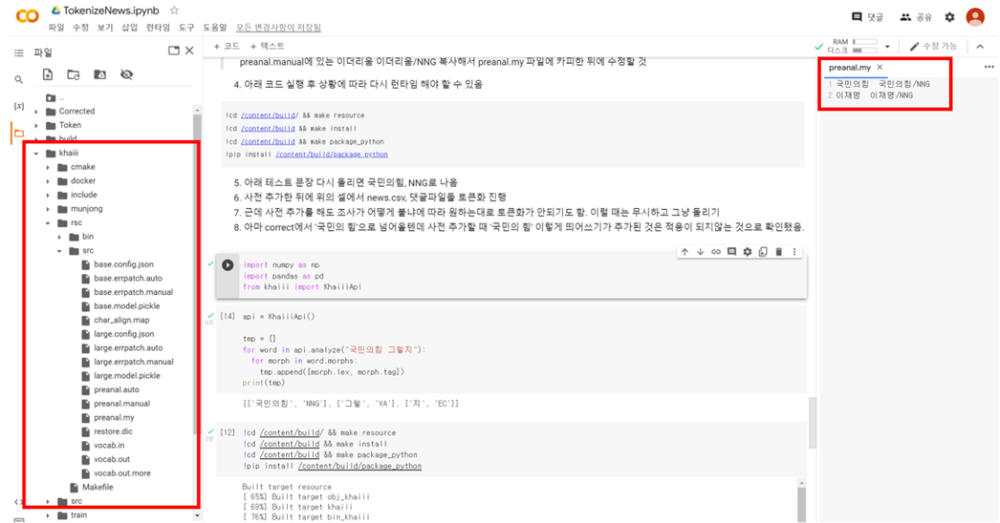
1. 처음 import하고 "국민의힘 그렇지"를 토큰화하면 국민/의/힘 으로 토큰화됨.
2. khaiii/rsc/src에 'preanal.my' 새 파일 생성
3. 국민의힘	국민의힘/NNG 삽입

> 이때 '국민의힘|띄어쓰기|국민의힘/NNG'로 그냥 추가하면 에러 발생(가독성을 위해 '|' 임의로 삽입한 것)\
preanal.manual에 있는 이더리움 이더리움/NNG 복사해서 preanal.my 파일에 카피한 뒤에 수정할 것


4. 아래 코드 실행 후 상황에 따라 다시 런타임 해야 할 수 있음

```
!cd /content/build/ && make resource
!cd /content/build && make install
!cd /content/build && make package_python
!pip install /content/build/package_python
```
5. 아래 테스트 문장 다시 돌리면 국민의힘, NNG로 나옴
6. 사전 추가한 뒤에 위의 셀에서 news.csv, 댓글파일들 토큰화 진행
7. 근데 사전 추가를 해도 조사가 어떻게 붙냐에 따라 원하는대로 토큰화가 안되기도 함. 이럴 때는 무시하고 그냥 돌리기
8. 아마 correct에서 '국민의 힘'으로 넘어올텐데 사전 추가할 때 '국민의 힘' 이렇게 띄어쓰기가 추가된 것은 적용이 되지않는 것으로 확인됐음.

In [ ]:
import numpy as np
import pandas as pd
from khaiii import KhaiiiApi

In [ ]:
api = KhaiiiApi()

tmp = []
for word in api.analyze("국민의힘 그렇지"):
  for morph in word.morphs:
    tmp.append([morph.lex, morph.tag])
print(tmp)

[['국민의힘', 'NNG'], ['그렇', 'VA'], ['지', 'EC']]


In [ ]:
!cd /content/build/ && make resource
!cd /content/build && make install
!cd /content/build && make package_python
!pip install /content/build/package_python

Built target resource
[ 65%] Built target obj_khaiii
[ 69%] Built target khaiii
[ 76%] Built target bin_khaiii
[100%] Built target test_khaiii
Install the project...
-- Install configuration: ""
-- Up-to-date: /usr/local/include/khaiii
-- Up-to-date: /usr/local/include/khaiii/KhaiiiApi.hpp
-- Up-to-date: /usr/local/include/khaiii/khaiii_api.h
-- Up-to-date: /usr/local/include/khaiii/khaiii_dev.h
-- Up-to-date: /usr/local/share/khaiii
-- Up-to-date: /usr/local/share/khaiii/restore.one
-- Up-to-date: /usr/local/share/khaiii/embed.bin
-- Up-to-date: /usr/local/share/khaiii/cnv2hdn.lin
-- Up-to-date: /usr/local/share/khaiii/errpatch.len
-- Up-to-date: /usr/local/share/khaiii/preanal.tri
-- Up-to-date: /usr/local/share/khaiii/conv.5.fil
-- Up-to-date: /usr/local/share/khaiii/restore.val
-- Up-to-date: /usr/local/share/khaiii/config.json
-- Up-to-date: /usr/local/share/khaiii/conv.2.fil
-- Up-to-date: /usr/local/share/khaiii/hdn2tag.lin
-- Up-to-date: /usr/local/share/khaiii/preanal.val
-- U